# M2 NE Only Analysis


Also just to be sure, it would be useful to have the following from me on only NE cells:
1. Redone velocity analysis with just NE (probably won’t change much)
2. Redone TF network with Booleabayes using only NE TFs
3. A supervised analysis of archetypes for just NE cells where I compare the archetypes I found using the unsupervised clustering to the core SCLC archetypes (A, A2, N, P, Y)


In [1]:
# import mazebox as mb
import scvelo as scv
import scanpy as sc
import os.path as op
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import sys
import dropkick as dk
# make sure to use position 1
sys.path.insert(1, "/Users/smgroves/Documents/GitHub/Groves-CellSys2021/")
import mazebox as mb
import cellrank as cr
import scanorama
from typing import Any
from copy import copy
from anndata import AnnData
import scipy.sparse as sp
from cellrank.tl.kernels import VelocityKernel
import warnings

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

In [2]:
adata = cr.read('../../data/M2/adata_03_filtered.h5ad')

/Users/smgroves/Documents/anaconda3/envs/mazebox_env/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.read` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.


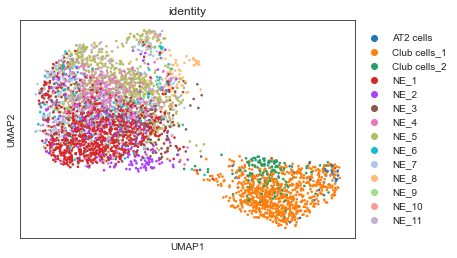

In [4]:
sc.pl.umap(adata, color = "identity")

In [8]:
adata

AnnData object with n_obs × n_vars = 4388 × 15728
    obs: 'doublet_scores', 'predicted_doublets', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'M', 'E', 'clusters_gradients', 'S_score', 'G2M_score', 'phase', 'cell_cycle_diff', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'brcd', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ATAC', 'nFeature_ATAC', 'nucleosome_signal', 'nucleosome_percentile', 'TSS.enrichment', 'TSS.percentile', 'barcode', 'sample', 'ATAC_snn_res.0.5', 'seurat_clusters', 'nCount_peaks', 'nFeature_peaks', 'peaks_snn_res.0.5', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'SCT.weight', 'peaks.weight', 'nCount_Imputed_counts', 'nFeature_Imputed_counts', 'nCount_gene_activity', 'nFeature_gene_activity', 'NE_score1', 'identity', 'non.NE_score1', 'comb.score', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'wsnn_res.0.5', 'specialists_pca_diffdist'
    var: 'Accession', 'Chromosome', 'End', 'Start', '

In [9]:
adata_NE = adata[adata.obs.identity.str.contains('NE'),]

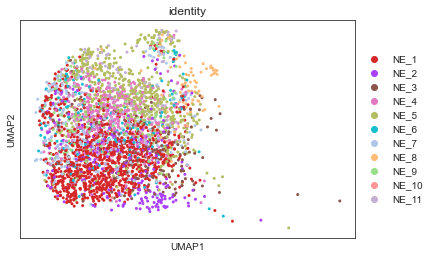

In [10]:
sc.pl.umap(adata_NE, color = "identity")

In [12]:
adata_NE.write_h5ad('../../data/M2/adata_NE.h5ad')


In [13]:
scv.pp.neighbors(adata_NE) # subsetting corrupted neighborhood graph-- redo here
scv.pp.moments(adata_NE)
# scv.tl.velocity(adata, mode = 'deterministic', groupby='cline')
# scv.tl.velocity_graph(adata)
scv.tl.recover_dynamics(adata_NE, n_jobs=8) #uses velocity genes from deterministic model as default
scv.tl.velocity(adata_NE, mode="dynamical")
scv.tl.velocity_graph(adata_NE)

computing neighbors


Trying to set attribute `._uns` of view, copying.


    finished (0:00:07) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 8/16 cores)


  0%|          | 0/691 [00:00<?, ?gene/s]

    finished (0:01:25) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/16 cores)


  0%|          | 0/3361 [00:00<?, ?cells/s]

    finished (0:00:06) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)
saving figure to file ./figures/scvelo_confidence.png


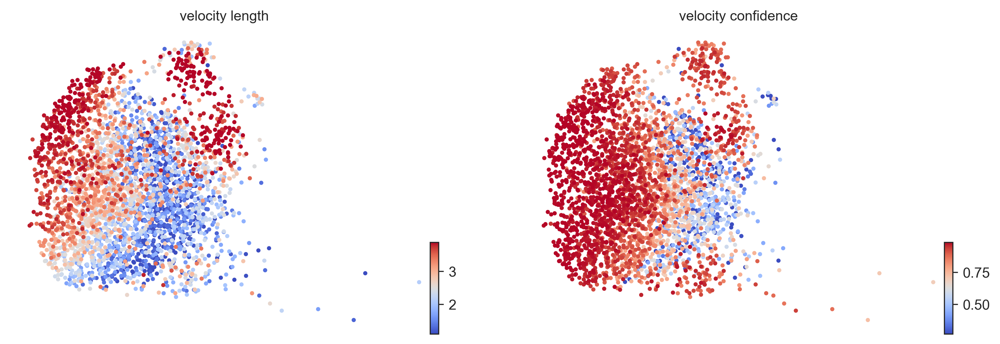

In [14]:
scv.tl.velocity_confidence(adata_NE)

keys = 'velocity_length', 'velocity_confidence'  
scv.pl.scatter(adata_NE, c=keys, cmap='coolwarm', perc=[5, 95], basis = 'umap',
                 dpi = 300, save = 'confidence.png')



computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file figures/identity_grid.png


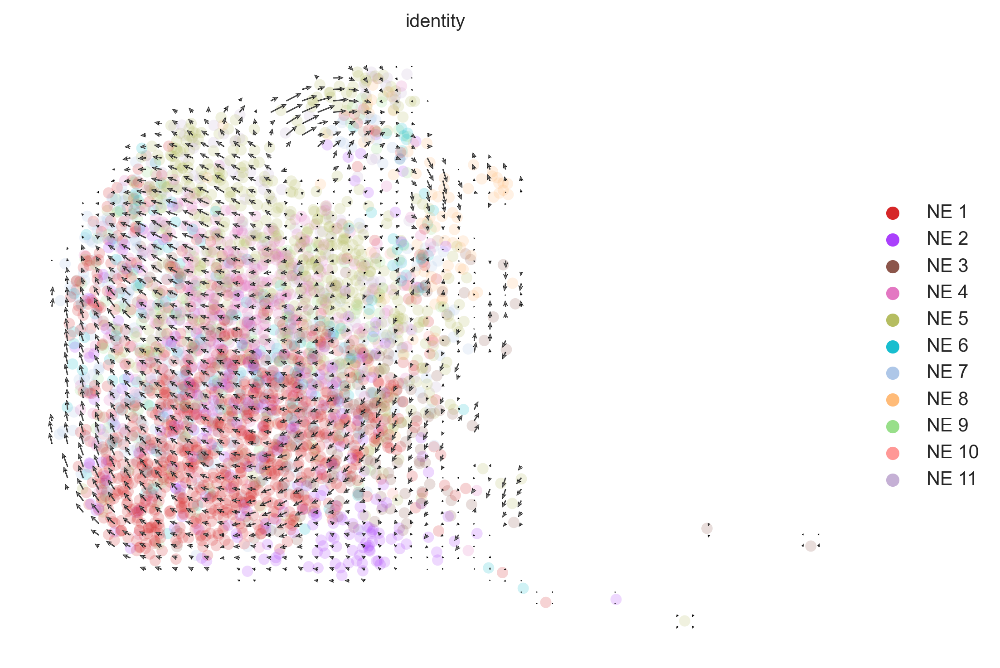

In [15]:
scv.pl.velocity_embedding_grid(adata_NE, vkey='velocity',basis = 'umap', figsize = (8,6), legend_loc = 'on right',color = 'identity',
                              dpi = 300, save = 'figures/identity_grid.png')


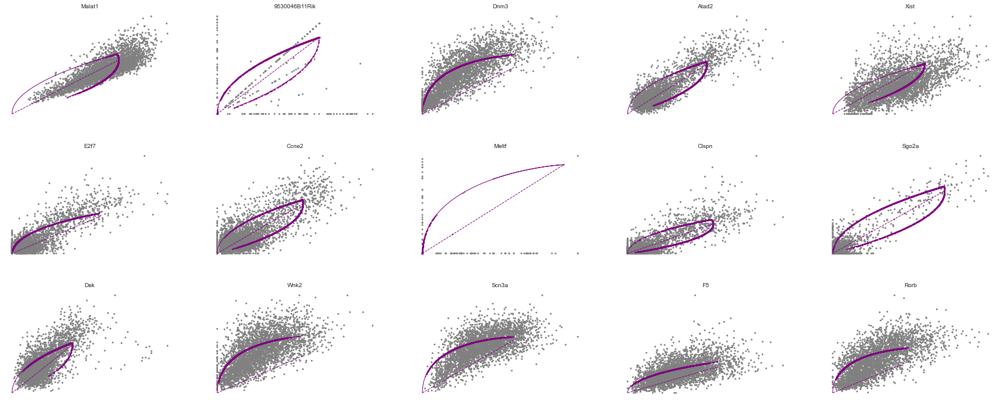

In [16]:
top_genes = adata_NE.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata_NE, basis=top_genes[:15], ncols=5, frameon=False)

saving figure to file figures/phase_stream.png


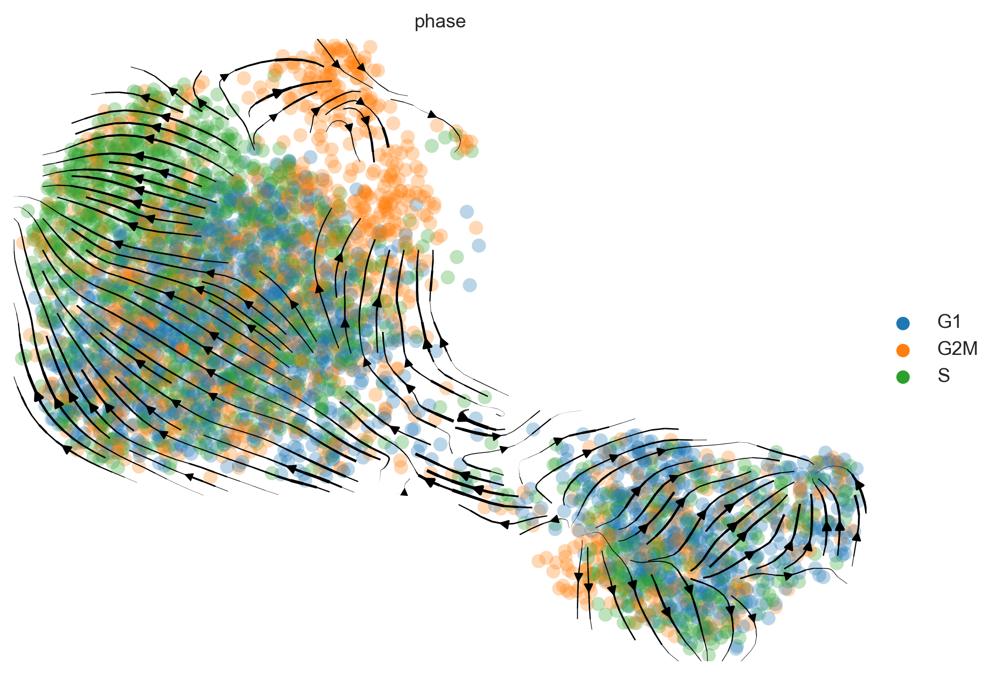

In [11]:
scv.pl.velocity_embedding_stream(adata, vkey='velocity',basis = 'umap', figsize = (8,6), legend_loc = 'on right',color = 'phase',
                              dpi = 300, save = 'figures/phase_stream.png')


## Kinetic Parameters

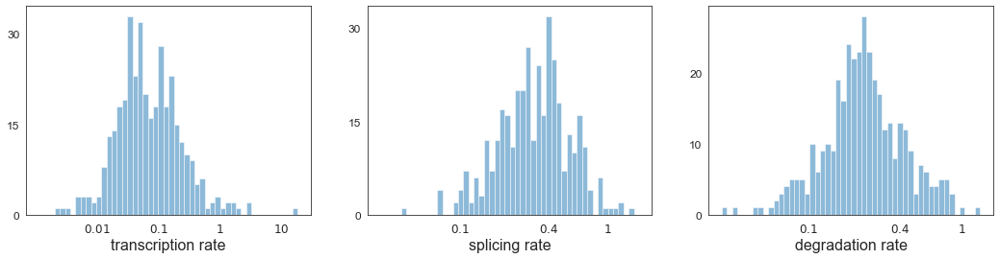

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
Gene,,,,,,,,,,,,,,,,
Mybl1,0.452847,0.158626,0.260783,0.389384,8.333870,0.821575,0.144470,0.081768,0.240215,0.0,0.0,0.363729,0.452326,0.229527,0.846800,1.995307
Il17f,0.087402,0.015334,0.268273,0.307091,5.734137,1.529268,0.017371,0.011927,0.004348,0.0,0.0,0.204470,0.033233,0.028654,0.555816,2.559347
Mcm3,0.020505,0.046723,0.415539,0.203071,9.975407,1.455754,0.050945,0.053280,0.180734,0.0,0.0,0.185588,0.153140,0.153731,1.381449,2.579774
Adgrb3,0.211520,0.029964,0.004863,0.147264,20.480682,46.883322,2.060051,0.049555,0.206482,0.0,0.0,0.129782,7.218745,0.150733,1.302223,5.453481
Gm8251,0.074709,0.099287,1.336241,0.207350,2.843205,0.445412,0.015730,0.053767,0.002827,0.0,0.0,0.410971,0.068495,0.141975,2.445867,2.192621


In [17]:
df = adata_NE.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata_NE, 'fit*', dropna=True).head()

In [18]:
df

,Accession,Chromosome,End,Start,Strand,gene_count_corr,dropkick_coef,mito,pct_dropout_by_counts,ambient,...,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,velocity_genes
Gene,,,,,,,,,,,,,,,,,,,,,
Mybl1,ENSMUSG00000025912,1,9700209,9667415,-,0.1193,NaN,False,91.035818,False,...,0.081768,0.240215,0.0,0.0,0.363729,0.452326,0.229527,0.846800,1.995307,True
Mcm3,ENSMUSG00000041859,1,20820312,20802968,-,0.0209,NaN,False,90.571152,False,...,0.053280,0.180734,0.0,0.0,0.185588,0.153140,0.153731,1.381449,2.579774,True
Bard1,ENSMUSG00000026196,1,71103146,71027498,-,0.0660,NaN,False,96.882865,False,...,0.032284,0.204193,0.0,0.0,0.088045,0.406820,0.093105,1.259015,5.705650,True
Igfbp5,ENSMUSG00000026185,1,72874884,72857932,-,-0.0712,0.000000,False,48.325266,False,...,0.729432,0.285454,0.0,0.0,0.443999,0.332173,2.264536,0.625963,1.715031,True
Scg2,ENSMUSG00000050711,1,79440120,79434669,-,0.0144,0.031279,False,78.005808,False,...,0.202243,0.108022,0.0,0.0,0.432607,0.086839,0.790371,2.163432,5.296720,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Kif4,ENSMUSG00000034311,X,100727214,100625737,+,0.0853,NaN,False,97.637948,False,...,0.052409,0.233799,0.0,0.0,0.410838,1.123625,0.169093,0.639714,0.931223,True
Tsix,ENSMUSG00000085715,X,103484957,103431517,+,0.1284,NaN,False,75.062924,False,...,0.133975,0.273254,0.0,0.0,0.252865,0.235877,0.396787,0.717634,3.171104,True
Cenpi,ENSMUSG00000031262,X,134362639,134308084,+,0.0801,NaN,False,98.586641,False,...,0.023035,0.187930,0.0,0.0,0.104749,0.285299,0.063784,1.015868,3.958536,True


In [19]:
df = scv.get_df(adata_NE, 'fit*', dropna=True).sort_values('fit_likelihood', ascending=False)

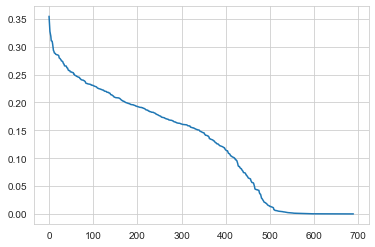

In [20]:
sns.set_style('whitegrid')
plt.plot(range(len(df.index)), df.fit_likelihood)
# plt.savefig('./figures/fit_likelihoods_cdf.pdf')

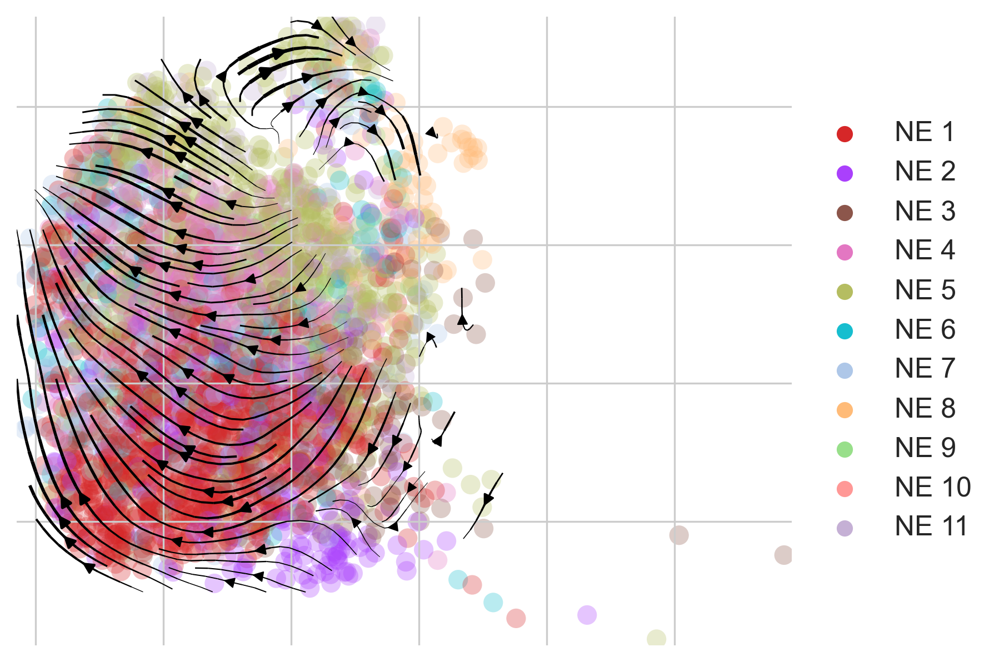

In [21]:
scv.pl.velocity_embedding_stream(
    adata_NE, basis="umap", color = ['identity'], legend_fontsize=12, title="", smooth=0.8, min_mass=4, 
    legend_loc = 'on right', dpi = 300, figsize = (6,5),
    # save = 'figures/scvelo_/by-timepoint/velocity-independent/subtypes_arcs_stream.png'
)

saving figure to file figures/top_gene_fits_subtypes.png


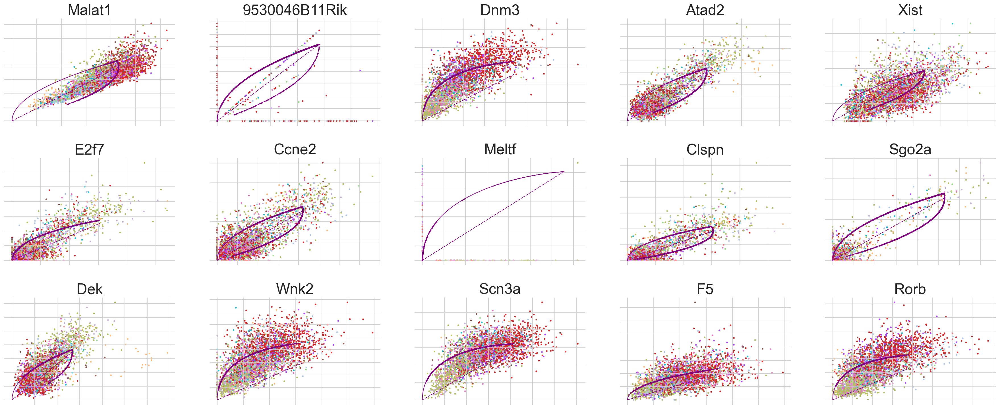

In [22]:

scv.pl.scatter(adata_NE, basis=top_genes[:15], ncols=5, frameon=False, color = 'identity', save = "figures/top_gene_fits_subtypes.png",
               fontsize = 25,size = 30,
               dpi = 150)

In [23]:
vk = VelocityKernel(adata_NE)
vk.compute_transition_matrix()

  0%|          | 0/3361 [00:00<?, ?cell/s]

  0%|          | 0/3361 [00:00<?, ?cell/s]

<VelocityKernel>

In [24]:
# combined_kernel = 0.8 * vk + 0.2* k
from cellrank.tl.estimators import GPCCA

g = GPCCA(vk)
g.compute_schur(n_components=20)
print(g)

Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000022e+00 1.3154591101342220e-01 -9.2576357396077946e-02 -1.0645509770308297e-01 1.3280795476603871e-01 1.7443840402678404e-01 -7.6789791538397715e-03 3.7926304492003744e-02 -6.2385695929381438e-02 5.1346793008230890e-02 -2.9601259601170608e-02 -4.4810811043356220e-02 3.2942839805850748e-03 -4.5560483596036247e-02 -1.6827741287125500e-01 -3.1401254174998568e-02 8.2903700659076388e-02 2.3985513454405426e-02 2.2297121362221908e-02 9.6397895972316600e-02 
0.0000000000000000e+00 8.6549968460140936e-01 3.8757746216591560e-02 1.0458977158631259e-01 5.0980968177598035e-02 4.9253244191574133e-02 4.7649534621328711e-02 3.0480119344857989e-02 -8.5034457723215690e-02 -3.6455759321912695e-02 -3.8503743717202013e-02 -2.0264701265940321e-01 -3.3058767433304177e-03 -2.4341593843590610e-03 2.5419573547583767e-02 3.1483710249104752e-03 -1.1408236346621912e-02 3.5134559477325189e-02 -3.9686545582658578e-02 -6.6977360839568595e-02 
0.0000000000000

## Macrostates: timepoints

/Users/smgroves/Documents/anaconda3/envs/mazebox_env/lib/python3.7/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


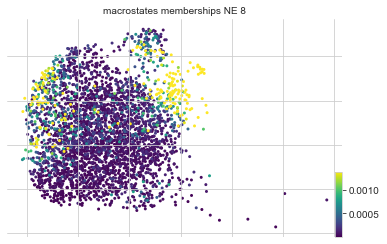

  0%|          | 0/1 [00:00<?, ?/s]

In [25]:
g.compute_macrostates(cluster_key="identity") 
g.plot_macrostates()
g.compute_terminal_states() 
g.compute_absorption_probabilities(solver="gmres", use_petsc=True)

In [26]:
scv.tl.paga(
    adata_NE,
    groups="identity",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    # use_time_prior="Diffusion Pseudotime",
)

running PAGA using priors: ['velocity_pseudotime', 'terminal_states_probs']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/Users/smgroves/Documents/anaconda3/envs/mazebox_env/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:724: MatplotlibDeprecationWarning: Passing *transOffset* without *offsets* has no effect. This behavior is deprecated since 3.5 and in 3.6, *transOffset* will begin having an effect regardless of *offsets*. In the meantime, if you wish to set *transOffset*, call collection.set_offset_transform(transOffset) explicitly.
  alpha=alpha,
/Users/smgroves/Documents/anaconda3/envs/mazebox_env/lib/python3.7/site-packages/cellrank/pl/_cluster_fates.py:205: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  label="average absorption probability",


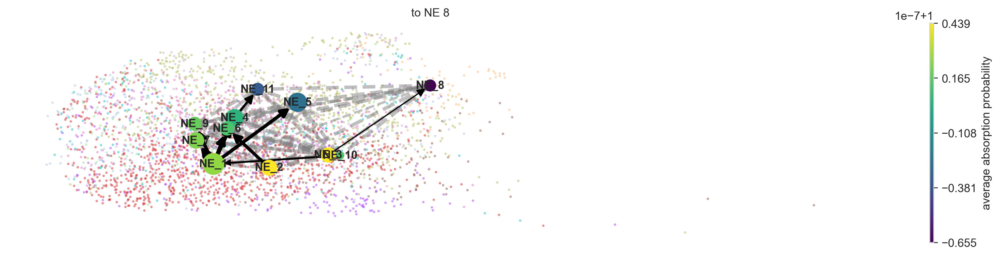

In [27]:
cr.pl.cluster_fates(
    adata_NE,
    mode="paga",
    cluster_key="identity",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="on data",
    node_size_scale=1,
    edge_width_scale=1,
    max_edge_width=3,
    title="Directed PAGA",figsize = (12, 3),
dpi = 300, save = './figures/scvelo_/by-timepoint/paga_timepoint.png')

So now we see that NE_8 looks like the end state, instead of NE_7. This is maybe concerning, and I would be inclined to trust the other analysis more, since it included all of the data. We may be accidentally cutting off the true end states and real movement, so NE_8 becomes a pseudo-endpoint. The fits above also don't look great; Most of them could probably just be fit linearly instead of with an almond shape. 


/Users/smgroves/Documents/anaconda3/envs/mazebox_env/lib/python3.7/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


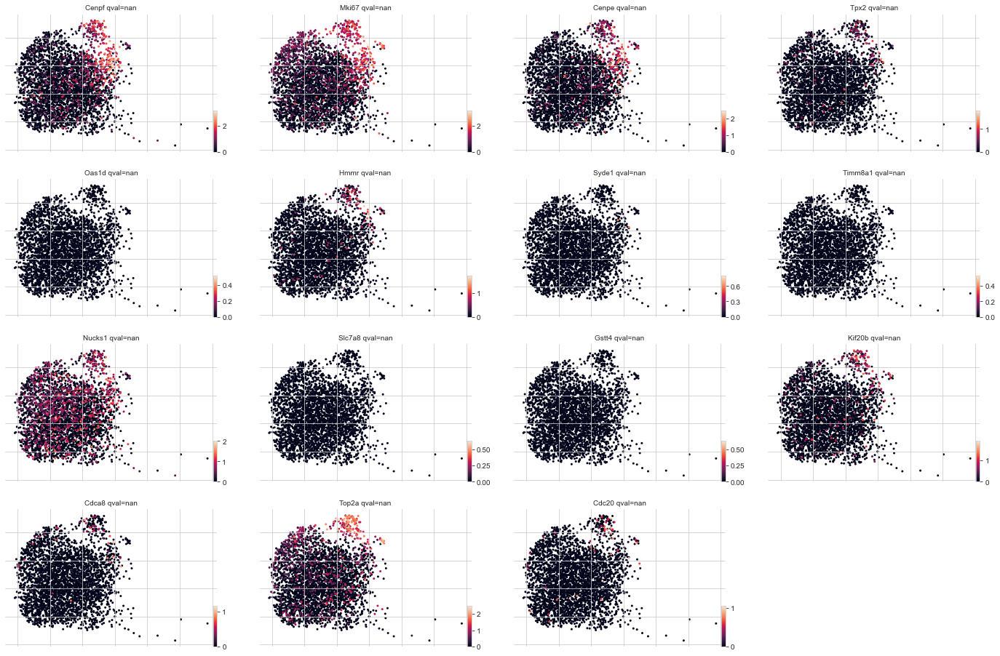

In [28]:
drivers = g.compute_lineage_drivers(lineages=['NE_8'], return_drivers=True)  #when running macrostates and terminal states by timepoint
drivers.sort_values(by="NE_8_corr", ascending=False)
g.plot_lineage_drivers("NE_8", n_genes=15)

In [29]:
mb.ps.ctrp_simplified(adata_NE,distance_basis='X_pca', T = vk.transition_matrix)



(3361, 3361)
Eigenvalues:  [1.]
    identified 1 end points
[[0.04020314 0.00119553 0.01673967 ... 0.0015272  0.00367373 0.00343566]
 [0.10416261 0.0015705  0.02321468 ... 0.00230082 0.00193976 0.0044784 ]
 [0.09167444 0.00246646 0.02154072 ... 0.00385625 0.00278353 0.00684861]
 ...
 [0.14048674 0.00278591 0.02412457 ... 0.00454357 0.00223924 0.00728598]
 [0.10071043 0.00178961 0.02584334 ... 0.00267508 0.00210078 0.00554397]
 [0.11789446 0.00162169 0.02549777 ... 0.00240468 0.00215894 0.00498333]]


/Users/smgroves/Documents/anaconda3/envs/mazebox_env/lib/python3.7/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


<AxesSubplot:title={'center':'ctrp'}>

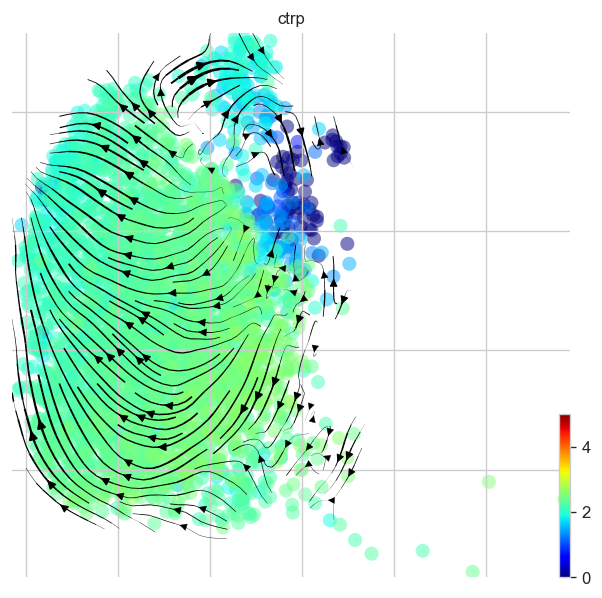

In [30]:
scv.pl.velocity_embedding_stream(adata_NE, color='ctrp', show=False, color_map='jet', alpha=0.5, basis='umap', dpi=120,
                    zorder=1,figsize=(6,6), vmax = 5)